# EXPLORATION 7. 인물사진을 만들어 보자.

## step 1. 인물모드 직접 해 보기

## 1(1). 노드보면서 따라가기!!

In [1]:
## 필요한 라이브러리 준비!

In [2]:
import os
import urllib    ## 웹에서 데이터를 다운로드 할 때 사용
import cv2       ## OpenCV 라이브러리로 이미지를 처리할 때 사용
import numpy as np
from pixellib.semantic import semantic_segmentation
## pixellib는 시맨틱 세그멘테이션을 편하게 사용할 수 있는 라이브러리
from matplotlib import pyplot as plt
%config InlineBackend.figure_format = 'retina'

print("슝 =3")

슝 =3


(1071, 1080, 3)


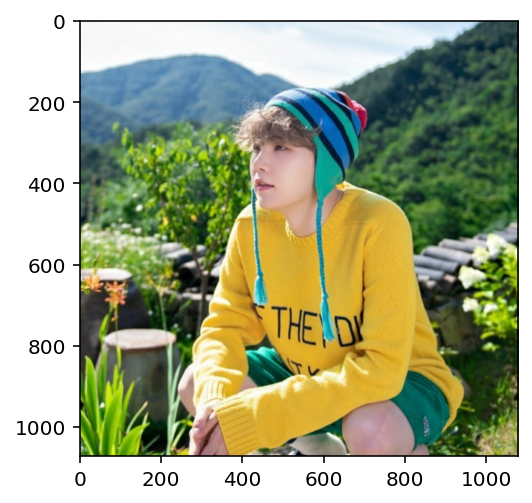

In [3]:
## 선택한 이미지의 경로에 맞게 바꿔준다.
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/hi.png'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [4]:
## 먼저 PixelLib 에서 제공해 주는 모델을 다운로드한다.
## 저장할 파일 이름을 결정한다.
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

## PixelLib가 제공하는 모델의 url이다.
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

## 다운로드를 시작한다.
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7fa848405550>)

In [5]:
## 다운로드한 모델을 이용해 PicelLib 로 우리가 사용할
## 세그멘테이션 모델을 생성한다.
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [6]:
## 모델에 이미지를 입력해보자.
segvalues, output = model.segmentAsPascalvoc(img_path)

In [7]:
## PASCAL VOC 데이터의 라벨 종류는 밑에 코드랑 동일
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

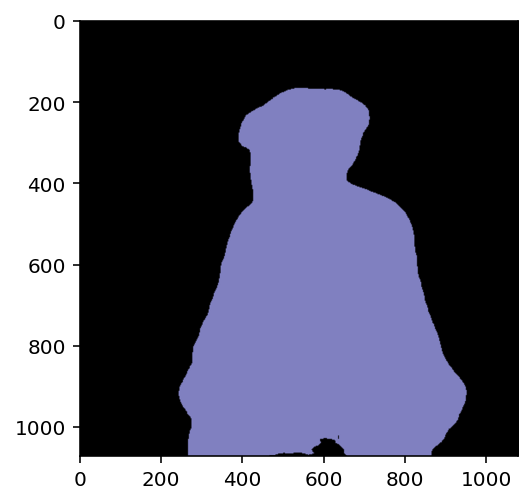

In [8]:
## 위에 라벨 중에서 사람라벨 15 를 가진 영역만 검출해 내고 싶다. 
## 일단 모델에서 나온 출력값을 출력
plt.imshow(output)
plt.show()

In [9]:
segvalues

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [10]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [11]:
## 아래 코드를 이해하지 않아도 좋다고 하네여.....
## PixelLib에서 그대로 가져온 코드이다.
## 주목해야 할 것은 생상 코드 결과물이다!

In [12]:

colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [13]:
## PixelLib 에 따르면 위에 저런 결과와 같은 색상을 사용함
## 사람을 나타내는 15번째 색상은?

colormap[15]

array([192, 128, 128])

In [14]:
## 우리가 추출해야 하는 색상 값은 순서를 바꿔줘야함

seg_color = (128,128,192)

(1071, 1080)


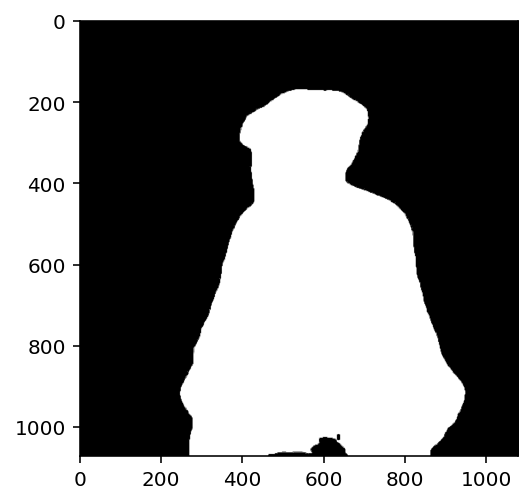

In [15]:
## seg_color 로만 이루어진 마스크를 만들어보자~
## output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 된다.

seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

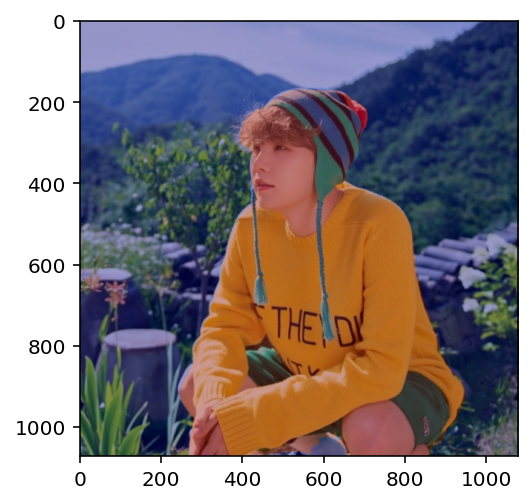

In [16]:
img_show = img_orig.copy()

## True과 False인 값을 각각 255과 0으로 바꿔준다.
img_mask = seg_map.astype(np.uint8) * 255

## 255와 0을 적당한 색상으로 바꿔본다.
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

## 원본 이미지와 마스트를 적당히 합쳐본다.
## 0.6과 0.4는 두 이미지를 섞는 비율이다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

### 배경을 흐리게 하기

### 일단은 노드에 나온 것 처럼 blurring kernel size를 (13, 13)으로 기본으로 해서 흐리게 해보았다.

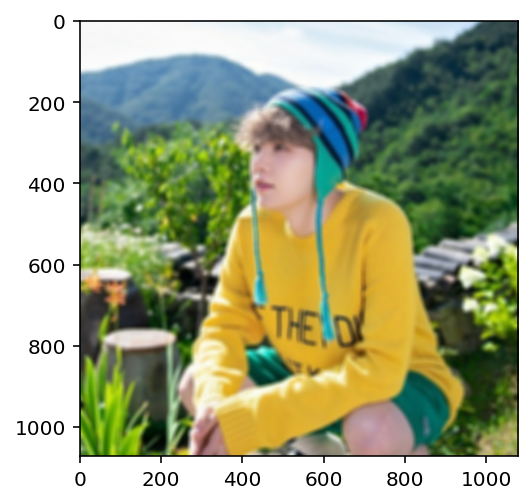

In [17]:
## 배경을 흐리게 하기 위해서는 blur() 함수를 이용한다.
## (13,13)은 blurring kernel size를 뜻한다.


img_orig_blur = cv2.blur(img_orig, (13,13))  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

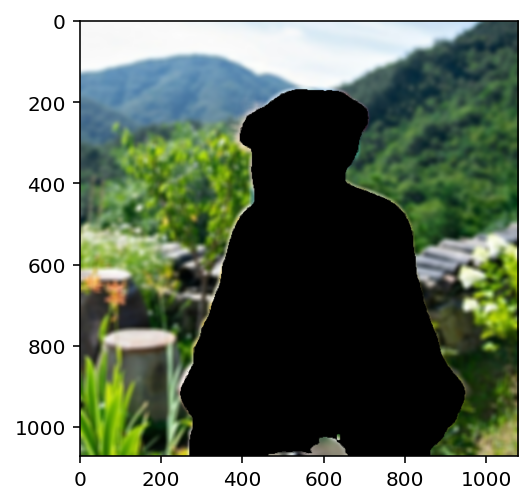

In [18]:
## 흐려진 이미지에다가 세그멘테이션 마스크를 이용해서 배경만 추출하기

img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

## AFTER

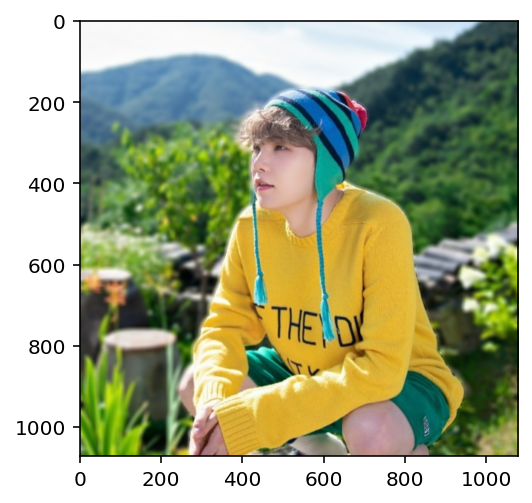

In [19]:
## 배경이랑 사람 영상을 합성!!

img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

## BEFORE

(1071, 1080, 3)


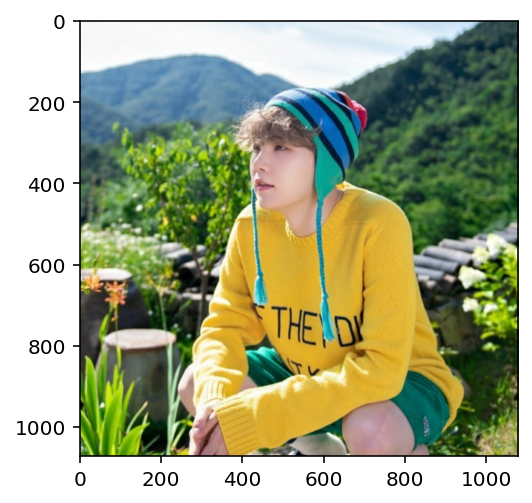

In [20]:
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

### 사진의 전, 후를 비교해서 보면 뒤에 배경이 흐릿해진것을 알 수 있다.  
### 하지만 blurring kernel size를 (13, 13)으로 해서 조금 적게 연해진 것 같다.  
### 다음 사진부터는 변경해가면서 조절해보기

## 1(2). 내 사진으로 인물모드 사진 만들어보기!

In [21]:
## 다른사진

(3443, 3024, 3)


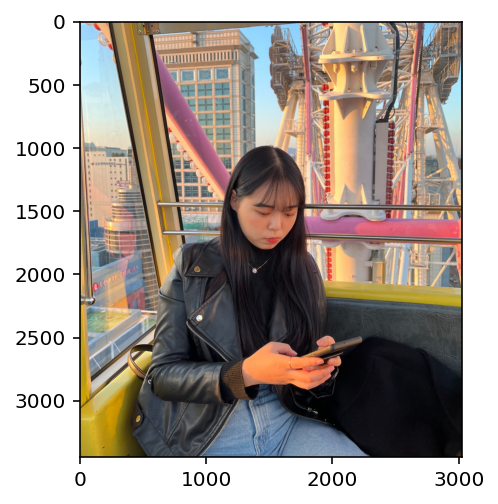

In [22]:
## 선택한 이미지의 경로에 맞게 바꿔준다.
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/3.png'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [23]:
## 먼저 PixelLib 에서 제공해 주는 모델을 다운로드한다.
## 저장할 파일 이름을 결정한다.
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

## PixelLib가 제공하는 모델의 url이다.
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

## 다운로드를 시작한다.
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7fa7de8972b0>)

In [24]:
## 다운로드한 모델을 이용해 PicelLib 로 우리가 사용할
## 세그멘테이션 모델을 생성한다.
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [25]:
## 모델에 이미지를 입력해보자.
segvalues, output = model.segmentAsPascalvoc(img_path)

In [26]:
## PASCAL VOC 데이터의 라벨 종류는 밑에 코드랑 동일
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

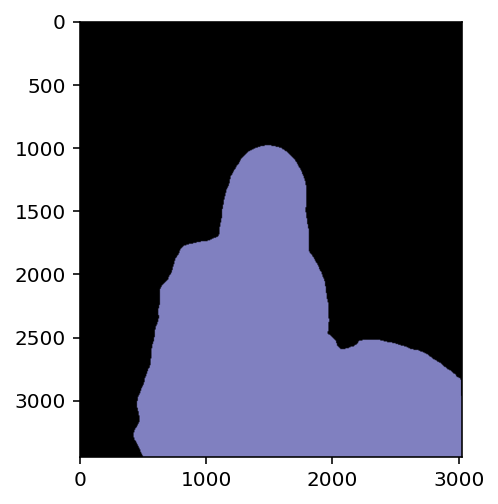

In [27]:
## 위에 라벨 중에서 사람라벨 15 를 가진 영역만 검출해 내고 싶다. 
## 일단 모델에서 나온 출력값을 출력
plt.imshow(output)
plt.show()

In [28]:
segvalues

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True]])}

In [29]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [30]:
## 아래 코드를 이해하지 않아도 좋다고 하네여.....
## PixelLib에서 그대로 가져온 코드이다.
## 주목해야 할 것은 생상 코드 결과물이다!

colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [31]:
## PixelLib 에 따르면 위에 저런 결과와 같은 색상을 사용함
## 사람을 나타내는 15번째 색상은?

colormap[15]

array([192, 128, 128])

In [32]:
## 우리가 추출해야 하는 색상 값은 순서를 바꿔줘야함

seg_color = (128,128,192)

(3443, 3024)


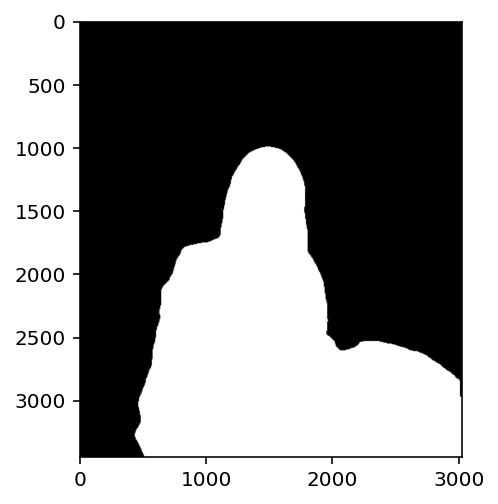

In [33]:
## seg_color 로만 이루어진 마스크를 만들어보자~

## output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 된다.
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

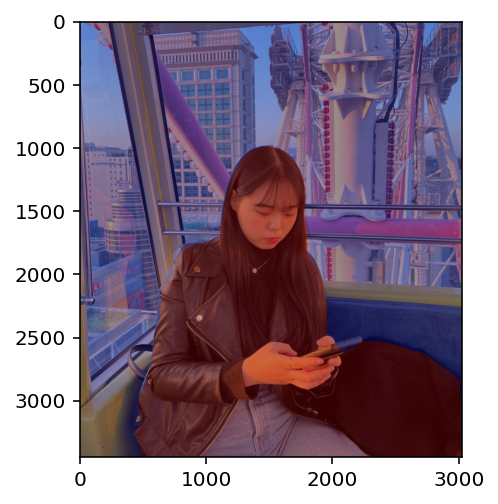

In [34]:
img_show = img_orig.copy()

## True과 False인 값을 각각 255과 0으로 바꿔준다.
img_mask = seg_map.astype(np.uint8) * 255

## 255와 0을 적당한 색상으로 바꿔본다.
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

## 원본 이미지와 마스트를 적당히 합쳐본다.
## 0.6과 0.4는 두 이미지를 섞는 비율이다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

### 배경을 흐리게 하기

### 여기서는 인물인 내가 색감이 어둡고 뒤에 배경이 더 밝기 때문에 blurring kernel size를 높여서 뒤에 배경을 더 흐리게 만들어 주었다.

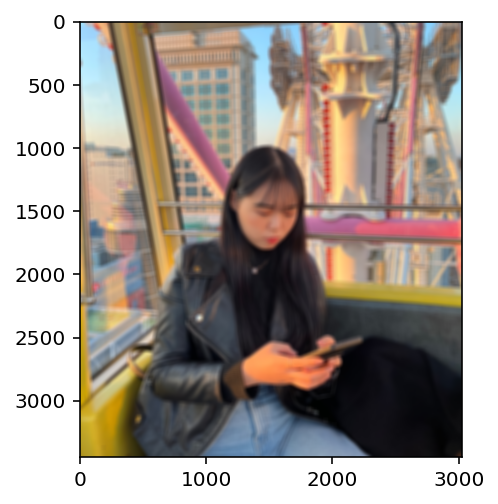

In [35]:
## 배경을 흐리게 하기 위해서는 blur() 함수를 이용한다.

## (13,13)은 blurring kernel size를 뜻한다.

img_orig_blur = cv2.blur(img_orig, (40,40))  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

## 사진이 밝아서 kernel size 를 확실하게 바꿔줬다.

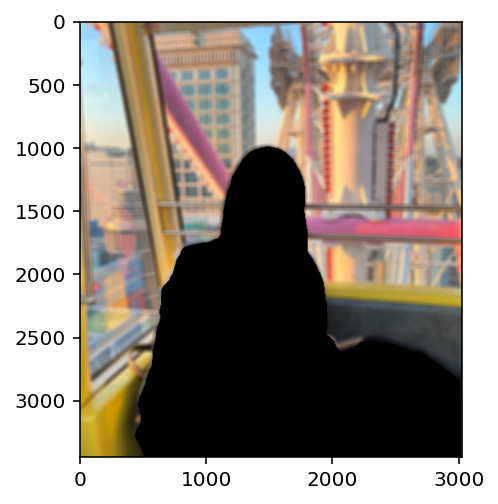

In [36]:
## 흐려진 이미지에다가 세그멘테이션 마스크를 이용해서 배경만 추출하기

img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

## AFTER

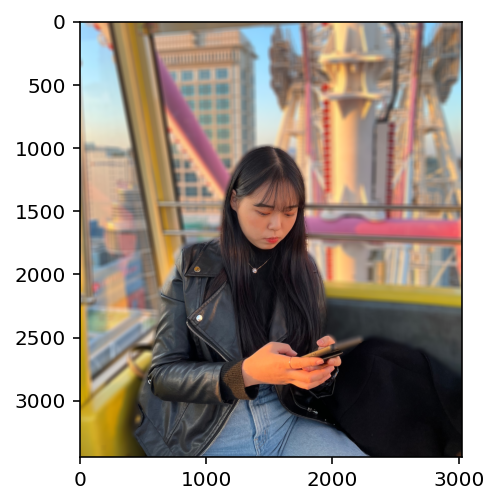

In [37]:
## 배경이랑 사람 영상을 합성!!
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

## BEFORE

(3443, 3024, 3)


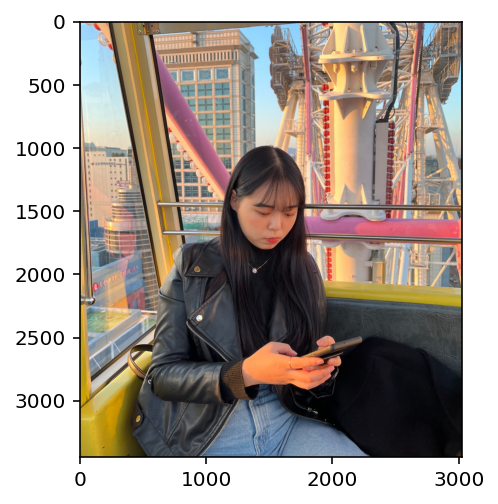

In [38]:
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

### 위에 사진보다는 훨씬 인물사진처럼 뚜렷해 보이는 것을 알 수 있다.

### 문제점 : 바로 옆에 있는 옷이 애매하게 걸쳐있어서 옷까지 같이 인식이 되서 배경이랑 같이 흐릿하게 블러처리가 잘 되지 않았다. 

## 1(3). 고양이 사진으로 인물모드 사진만들기!

In [39]:
## 필요한 라이브러리 준비!

In [40]:
import os
import urllib    ## 웹에서 데이터를 다운로드 할 때 사용
import cv2       ## OpenCV 라이브러리로 이미지를 처리할 때 사용
import numpy as np
from pixellib.semantic import semantic_segmentation
## pixellib는 시맨틱 세그멘테이션을 편하게 사용할 수 있는 라이브러리
from matplotlib import pyplot as plt

print("슝 =3")

슝 =3


### 친구네 고양이 사진을 가지고 와서 이미지를 업데이트

(1693, 1178, 3)


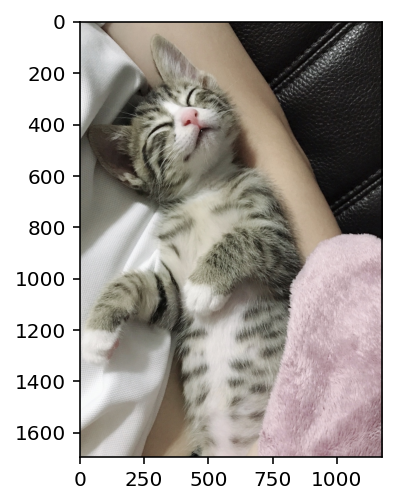

In [41]:
## 선택한 이미지의 경로에 맞게 바꿔준다.
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/1.png'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [42]:
## 먼저 PixelLib 에서 제공해 주는 모델을 다운로드한다.
## 저장할 파일 이름을 결정한다.
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

## PixelLib가 제공하는 모델의 url이다.
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

## 다운로드를 시작한다.
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7fa7d7c6cd00>)

In [43]:
## 다운로드한 모델을 이용해 PicelLib 로 우리가 사용할
## 세그멘테이션 모델을 생성한다.
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [44]:
## 모델에 이미지를 입력해보자.
segvalues, output = model.segmentAsPascalvoc(img_path)

In [45]:
## PASCAL VOC 데이터의 라벨 종류는 밑에 코드랑 동일
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

### 아까 위에서 사람라벨이 15였는데 이번에는 고양이기 때문에 위에 PASCAL VOC 데이터의 라벨 종류를 보면 고양이는 라벨 8인 것을 알 수 있다. 

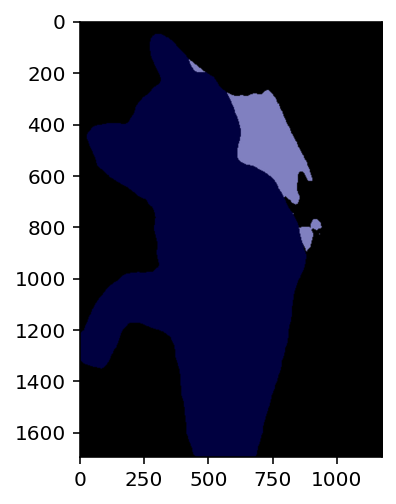

In [46]:
## 위에 라벨 중에서 고양이라벨 8 를 가진 영역만 검출해 내고 싶다. 
## 일단 모델에서 나온 출력값을 출력

plt.imshow(output)
plt.show()

In [47]:
segvalues

{'class_ids': array([ 0,  8, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [48]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
cat
person


In [49]:
## 아래 코드를 이해하지 않아도 좋다고 하네여.....
## PixelLib에서 그대로 가져온 코드이다.
## 주목해야 할 것은 생상 코드 결과물이다!

colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [50]:
## PixelLib 에 따르면 위에 저런 결과와 같은 색상을 사용함
## 고양이를 나타내는 8번째 색상은?

colormap[8]

array([64,  0,  0])

고양이를 나타내는 색상이 [64, 0, 0] 이기 때문에 밑에 코드로 색상 값의 순서를 바꿔주면 된다.

In [51]:
## 우리가 추출해야 하는 색상 값은 순서를 바꿔줘야함

seg_color = (0,0,64)

(1693, 1178)


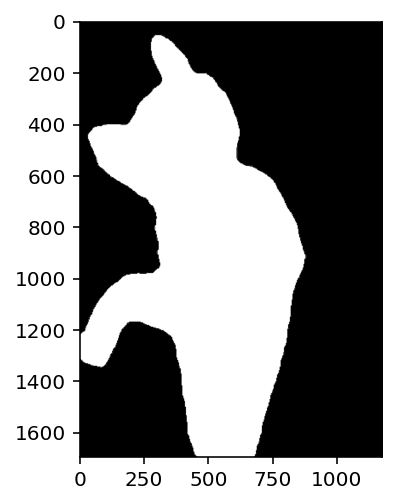

In [52]:
## seg_color 로만 이루어진 마스크를 만들어보자~
## output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 된다.

seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

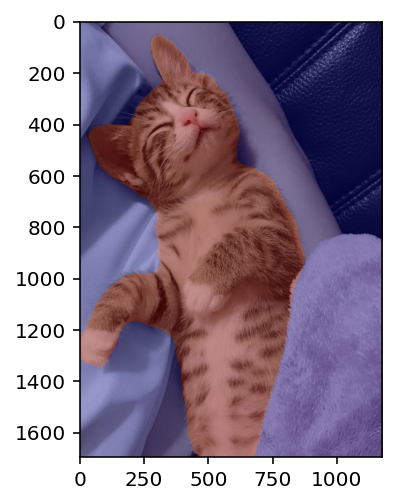

In [53]:
img_show = img_orig.copy()

## True과 False인 값을 각각 255과 0으로 바꿔준다.
img_mask = seg_map.astype(np.uint8) * 255

## 255와 0을 적당한 색상으로 바꿔본다.
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

## 원본 이미지와 마스트를 적당히 합쳐본다.
## 0.6과 0.4는 두 이미지를 섞는 비율이다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

### 배경을 흐리게 하기

### 고양이가 친구 팔에 안겨 있기 때문에, 고양이가 확실히 돋보이는게 나을 것 같다고 느꼈다.   
### 그래서 위에서 했던 blurring kernel size 보다 더 큰 (50,50)으로 해줬다.

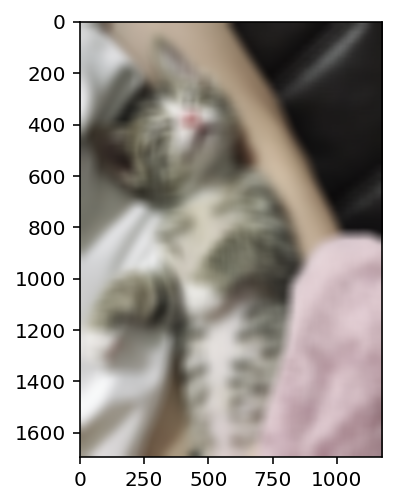

In [54]:
## 배경을 흐리게 하기 위해서는 blur() 함수를 이용한다.

img_orig_blur = cv2.blur(img_orig, (50,50))  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

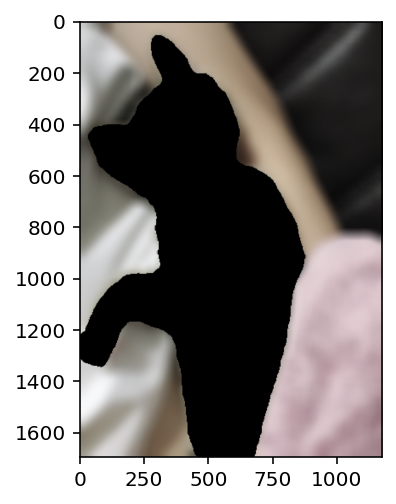

In [55]:
## 흐려진 이미지에다가 세그멘테이션 마스크를 이용해서 배경만 추출하기

img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

## AFTER

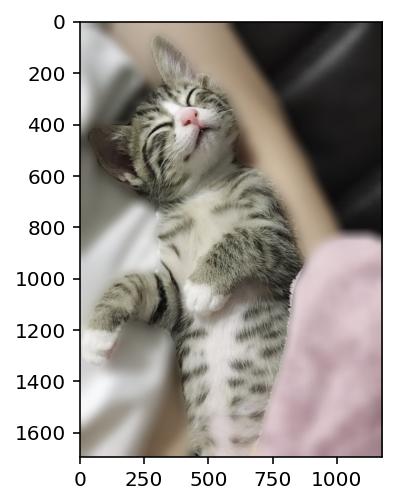

In [56]:
## 배경이랑 고양이 영상을 합성!!
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

## BEFORE

(1693, 1178, 3)


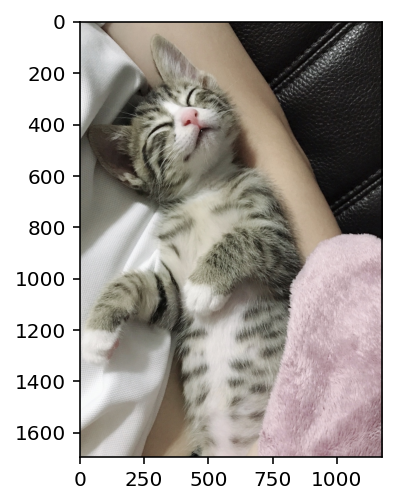

In [57]:
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

### 문제점: 티셔츠가 흰 색인데 고양이 발 끝이 흰 색이어서 끝에가 확실하게 돋보이지 않는 것 같고! 발이 블러처리가 조금은 되고 조금은 되지 않았던 것 같다.

## 1(4). 크로마키 배경 합성

In [58]:
import pixellib
from pixellib.tune_bg import alter_bg


### 배경 앞에 인물이 될 사진을 먼저 설정해준다!

(1148, 923, 3)


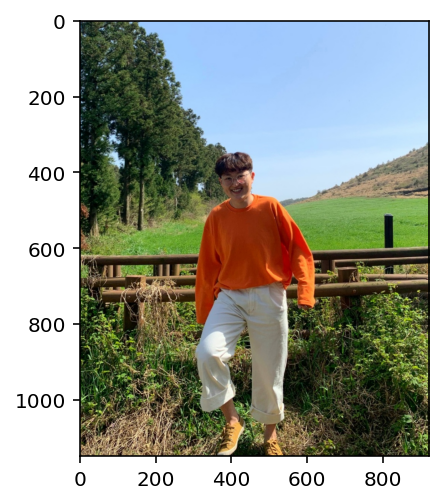

In [59]:
##선택한 이미지의 경로에 맞게 바꿔준다.
new_img = os.getenv('HOME')+'/aiffel/human_segmentation/images/new_img.png'  
img_orig = cv2.imread(new_img) 

print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [60]:
## 먼저 PixelLib 에서 제공해 주는 모델을 다운로드한다.
## 저장할 파일 이름을 결정한다.
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

## PixelLib가 제공하는 모델의 url이다.
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

## 다운로드를 시작한다.
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7fa7d7f56280>)

In [61]:
## 다운로드한 모델을 이용해 PicelLib 로 우리가 사용할
## 세그멘테이션 모델을 생성한다.
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [62]:
## 모델에 이미지를 입력해보자.
segvalues, output = model.segmentAsPascalvoc(new_img)

In [63]:
## PASCAL VOC 데이터의 라벨 종류는 밑에 코드랑 동일
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

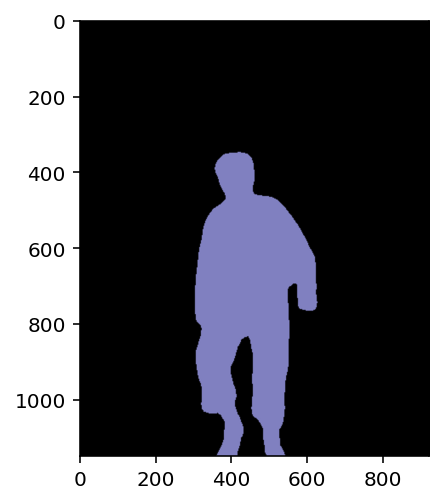

In [64]:
## 위에 라벨 중에서 사람라벨 15 를 가진 영역만 검출해 내고 싶다. 
## 일단 모델에서 나온 출력값을 출력
plt.imshow(output)
plt.show()

In [65]:
segvalues

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [66]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [67]:
## 아래 코드를 이해하지 않아도 좋다고 하네여.....
## PixelLib에서 그대로 가져온 코드이다.
## 주목해야 할 것은 생상 코드 결과물이다!

colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [68]:
## PixelLib 에 따르면 위에 저런 결과와 같은 색상을 사용함
## 사람을 나타내는 15번째 색상은?

colormap[15]

array([192, 128, 128])

In [69]:
## 우리가 추출해야 하는 색상 값은 순서를 바꿔줘야함

seg_color = (128,128,192)

(1148, 923)


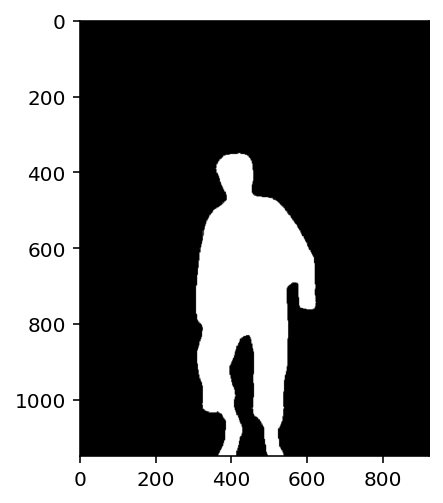

In [70]:
## seg_color 로만 이루어진 마스크를 만들어보자~

## output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 된다.
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

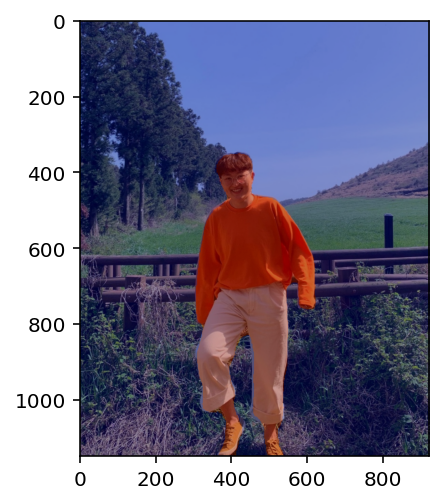

In [71]:
img_show = img_orig.copy()

## True과 False인 값을 각각 255과 0으로 바꿔준다.
img_mask = seg_map.astype(np.uint8) * 255

## 255와 0을 적당한 색상으로 바꿔본다.
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

## 원본 이미지와 마스트를 적당히 합쳐본다.
## 0.6과 0.4는 두 이미지를 섞는 비율이다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

### 인물을 붙일 뒤에 배경을 설정해주고 불러온다.

(500, 364, 3)


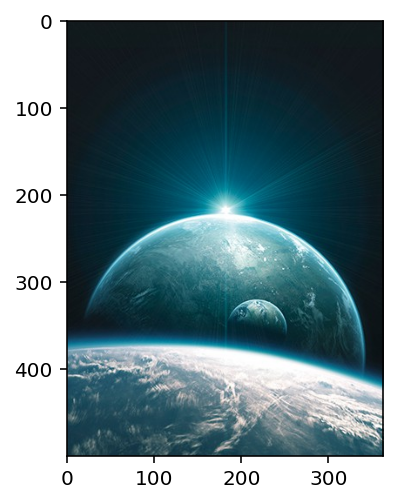

In [72]:
background = os.getenv('HOME')+'/aiffel/human_segmentation/images/background.png'  
img_orig_bg = cv2.imread(background) 

print(img_orig_bg.shape)
plt.imshow(cv2.cvtColor(img_orig_bg, cv2.COLOR_BGR2RGB))
plt.show()

### 위에 인물 사진 사이즈는 (1148, 923, 3) 였는데! 우주 배경의 사이즈는 (500, 364, 3)이다.   
### 사진 사이즈가 다르면 합성이 안되기 때문에 우주 사진을 인물 사진 사이즈로 변경해주겠다!

img_orig_bg.shape = (500, 364, 3)
resize_img.shape = (1148, 923, 3)


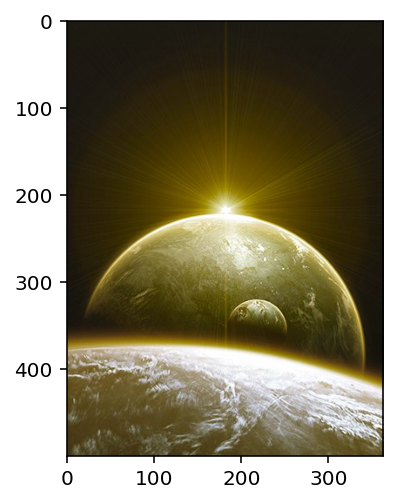

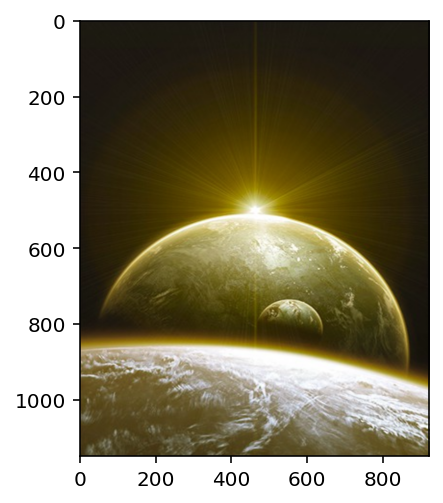

In [73]:
img_orig_bg = cv2.imread(background) 
print("img_orig_bg.shape = {0}".format(img_orig_bg.shape))

resize_img = cv2.resize(img_orig_bg, (923, 1148))
print("resize_img.shape = {0}".format(resize_img.shape))

plt.imshow(img_orig_bg)
plt.show()
plt.imshow(resize_img)



### 사진 사이즈가 잘 변경된 것을 눈으로도 확인 가능하다!  
### 문제점은 사진이 갑자기 노랗게 변했다...그래서 다시 푸른 색 BGR 로 바꿔준다.

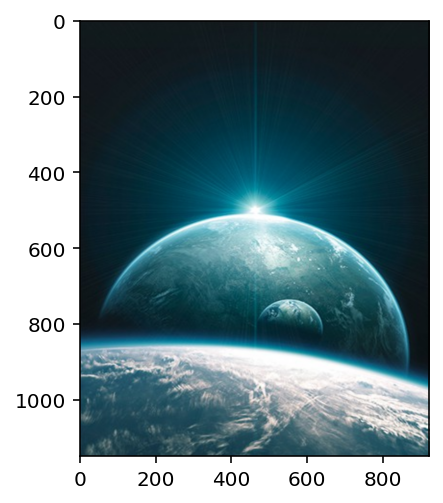

In [74]:
## RGB 이미지로 바꿔줘야한다.
img_rgb1 = cv2.cvtColor(resize_img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb1)
plt.show()

In [75]:
## 사진 사이즈가 잘 변경되었는지 확인해보기~~~~~~

print(img_rgb1.shape)

(1148, 923, 3)


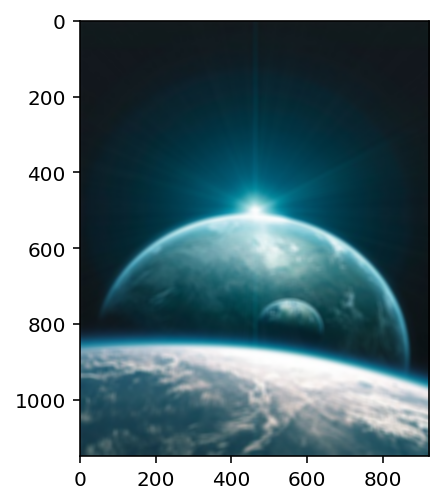

In [76]:
## 배경을 흐리게 하기 위해서는 blur() 함수를 이용한다.

## (13,13)은 blurring kernel size를 뜻한다.
img_orig_blur = cv2.blur(img_rgb1, (13,13))  
plt.imshow(img_orig_blur)
plt.show()

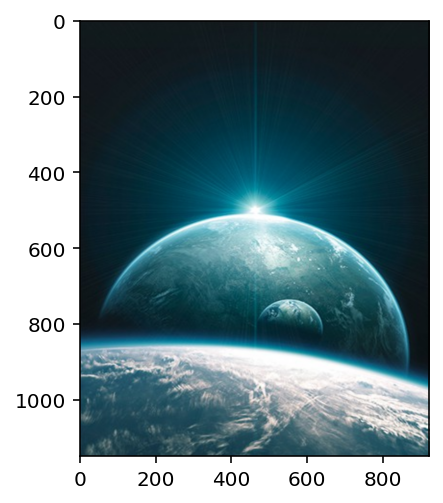

In [77]:
## 흐려진 이미지에다가 세그멘테이션 마스크를 이용해서 배경만 추출하기

img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_rgb1, img_bg_mask)
plt.imshow(img_rgb1)
plt.show()

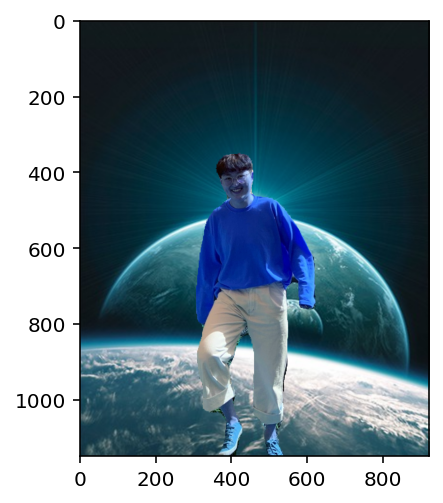

In [78]:
## 배경이랑 사람 영상을 합성!!
img_concat = np.where(img_mask_color==255,img_orig, img_rgb1)
plt.imshow(img_concat)
plt.show()

### rgb로 바꿔서 합성을 했는데 사람까지 다 푸르스름 해졌다...뭔가 이상하다...ㅜ

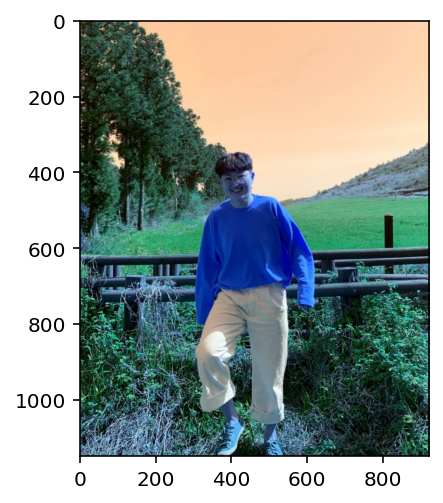

In [79]:
plt.imshow(img_orig)

### img_orig를 보니까 이게 bgr로 되어있어서 색이 이상하게 나온거였다. => 그래서 저 이미지부터 바꿔주기!

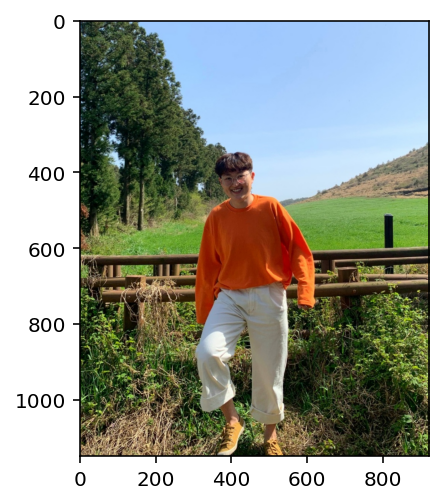

In [86]:
## RGB 이미지로 바꾸기
img_rgb_orig = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb_orig)
plt.show()

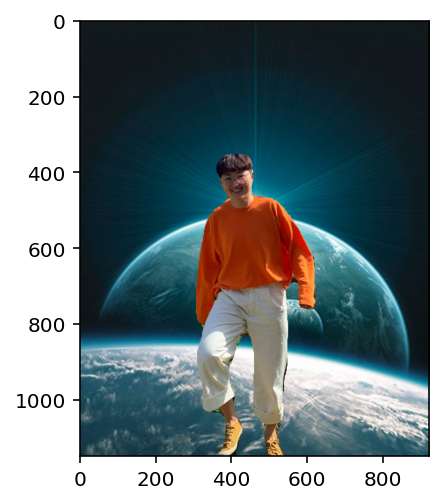

In [87]:
## 배경이랑 사람 영상을 합성!!
img_concat = np.where(img_mask_color==255,img_rgb_orig, img_rgb1)
plt.imshow(img_concat)
plt.show()


## 정상적으로 출력됨

### 문제점 : 바지나 티셔츠에 각이 잡히는 부분들은 선이 제대로 따지지 않고,   예전 배경이 조금씩 나와서 바지 부분이 부자연스러운 것을 볼 수 있다.

...

## 2. 문제점 분석!

### 위에서 문제점을 작성했지만 다시 적어보자면!!  
### 문제점 1 : 바로 옆에 있는 옷이 애매하게 걸쳐있어서 옷까지 같이 인식이 되서 배경이랑 같이 흐릿하게 블러처리가 잘 되지 않았다. 

(788, 690, 3)


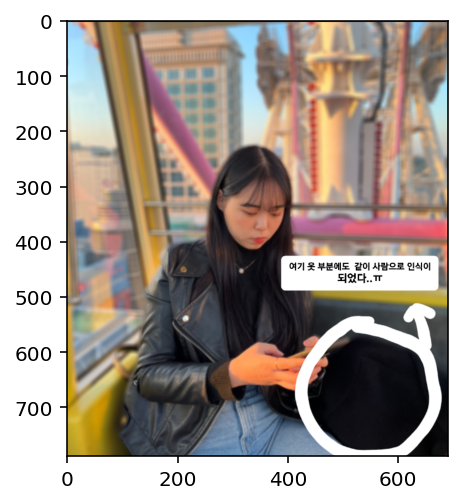

In [80]:
problem_1= os.getenv('HOME')+'/aiffel/human_segmentation/images/3_fix.png'  
img_orig_bg = cv2.imread(problem_1) 

print(img_orig_bg.shape)
plt.imshow(cv2.cvtColor(img_orig_bg, cv2.COLOR_BGR2RGB))
plt.show()

### 문제점 2 : 티셔츠가 흰 색인데 고양이 발 끝이 흰 색이어서 끝에가 확실하게 돋보이지 않는 것 같고! 발이 블러처리가 조금은 되고 조금은 되지 않았던 것 같다.

(750, 520, 3)


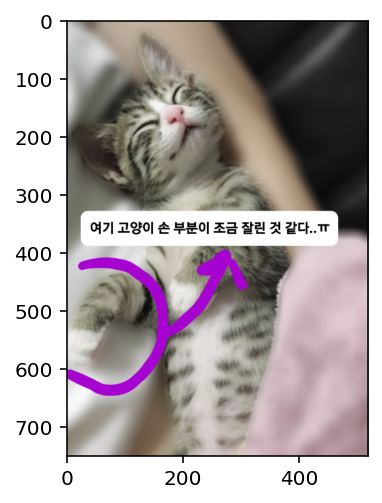

In [81]:
problem_2= os.getenv('HOME')+'/aiffel/human_segmentation/images/1_fix.png'  
img_orig_bg = cv2.imread(problem_2) 

print(img_orig_bg.shape)
plt.imshow(cv2.cvtColor(img_orig_bg, cv2.COLOR_BGR2RGB))
plt.show()

### 문제점 3 : 바지나 티셔츠에 각이 잡히는 부분들은 선이 제대로 따지지 않고,   예전 배경이 조금씩 나와서 바지 부분이 부자연스러운 것을 볼 수 있다.

(650, 520, 3)


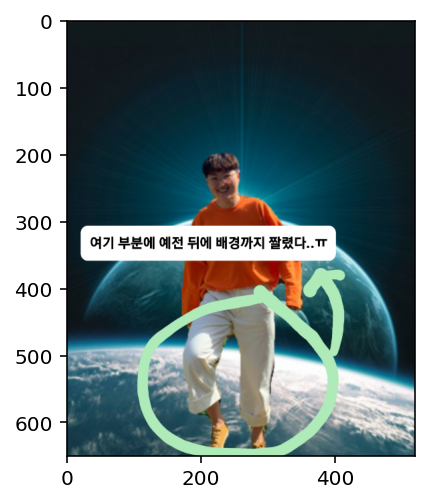

In [89]:
problem_3= os.getenv('HOME')+'/aiffel/human_segmentation/images/new_img_fix.png'  
img_orig_bg = cv2.imread(problem_3) 

print(img_orig_bg.shape)
plt.imshow(cv2.cvtColor(img_orig_bg, cv2.COLOR_BGR2RGB))
plt.show()

## 3. 해결방법 제안해보기!

3가지 다 문제점이 정확히 물체의 선이 깔끔하게 나오지 않았다는 공통점이 있다.  
일단 두 번째 문제점 고양이를 보면 앞에 있는 발과 뒤에 있는 티셔츠를 구분 못해서 명확하게 구분이 안되었다.

먼저, 생각했던 해결방법 첫 번째는!!  
RGB 만 보는 것이 아니라 알파나 다른 것을 추가해서 원근을 생각해서 멀고 가까운 거를 구분 할 수 있는 차원을 만드는 것이다. 예를 들어 just dance라는 게임을 보면 거리센서를 사용해서 행동을 더 명확하게 파악한다. 이러한 원리를 생각해서 그 멀고 가까운 원근법을 생각해서 경계를 명확하게 해서 구분을 하는 것도 방법이라고 생각한다.

두 번째는, 학습데이터 세그멘테이션을 파악하게 만들어서 불투명해서 한 번에 해결이 불가능한 부분들을 학습시킨다. 해당 포커스에 맞춘 확실하게 알 수 있는 학습 데이터를 많이 넣고 학습을 시키다 보면 모델이 물체의 경계면을 더욱 명확하게 잡아낼 수 있을 것 같다고 생각한다.

세 번째는, 새로운 모델을 가져오는 것이다. 예를 들어, R-CNN 을 보면 저번에 스티커 이미지를 했던 것 처럼 bounding box로 객체를 표현해서 식별을 하는 것이다. 하지만 여기에는 한계가 많기 때문에 Mask R-CNN 같은 모델을 사용해서 픽셀 수준의 세그멘테이션까지 확장시켜 바운딩박스의 위치 뿐만 아니라! 정확한 픽셀 위치까지 파악하면 좀 더 선명하게 이미지를 잡아낼 수 있을 것 같다.

정리를 해보자면!
1. 새로운 차원의 거리를 구분할 수 있는 데이터를 넣는다.
2. 해당 포커스에 맞춘 확실하게 알 수 있는 학습데이터를 많이 넣는다.
3. 새로운 모델을 만든다.

# 회고!

## < 어려웠던 점>  
일단 마지막 크로마키 했을 때, 크기를 맞출 때 쉽지 않았던 것 같다... 코드를 분명히 배웠었는데 막상 직접해보려니까 쉽지 않아서 계속해서 에러가 발생했던 것 같다. 그리고 색상도 계속 RGB 로 바꿔줘야해서 크로마키가 오래걸렸던 것 같다. 그리고 사진을 보고 발생했던 문제점은 쉽게 바로 찾아낼 수 있었지만! 막상 각 문제점에 해당하고 보완할 수 있는 해결방법을 찾는 것이 매우 어려웠던 것 같다.

## < 알아낸 점> & < 아직까지 모호한 점>  
항상 휴대폰으로 수정하면서 블러처리를 직접 했었는데 이렇게 컴퓨터로 코드를 통해서 해보니까 신기했던 것 같다. 뒤에 배경만 흐리게 만들고 사람을 다시 넣고 하는 그 과정조차 생각도 못했던 부분이라서 그런지 아주 신기했던 것 같다. 그리고 세그멘테이션이라는 용어도 처음 들어봐서 신기했고! 사진을 인물사진으로 바꾸면서 하나하나 과정을 살펴보면서 하니까 더 잘 이해가 된 것 같다. 그리고 여러장의 다양한 사진을 비슷한 코드를 가지고 다루니까 각 코드에 대한 이해가 좀 더 올라갔던 것 같다. 

## <시도한 것들>  
음 해결방법을 생각해보고 고민하는데 시간이 많이 걸렸던 것 같다. 다양한 방법들을 찾아보면서 기존에 어떤 방법이 있는지 살펴 보았다. 그리고 코드를 짤 때는 사진과 배경에 따라서 인물사진 결과가 되게 달라지는 것 같아서! 여러 사진으로 고민하고 하다가 결정을 했다. 그리고 사진이 배경과 조금 거리가 있어야 더 명확하게 티가 나는 것 같다.

## < 자기 다짐>  
사실 문제점과 해결방법을 찾아보는 노드는 이번이 처음이었다. 노드를 하기에 바빴고 그냥 그 코드를 이해하고 넘어가기 바빴던 것 같다. 그렇지만! 이번에 해결방법으로 다양한 것을 찾아보다가 보니까 더 이 노드 전체가 이해하기에 좋았던 것 같다. 그래서 사실 매번 깊게 찾아보지는 않더라고 이 노드에 관련된 기술이나? 요즘 이슈 같은 거에 관심을 가지는 것도 노드 이해에 더 도움이 될 것 같다.